# GA_Solve_TSP

<left><img src="https://miro.medium.com/max/3200/1*BYDJpa6M2rzWNSurvspf8Q.png" width="50%" />

## algorithm
<left><img src="https://d2vlcm61l7u1fs.cloudfront.net/media%2F96d%2F96d5ef38-16fd-4caf-8ffa-21d3e5a1bf55%2FphpV4oTkh.png" />


## 1. test rand

In [1]:
import sys
import time
import math
import random
#transition     任兩個互換
#evalutation    連線距離和 
#determination  距離短者獲勝
#note:
#random.randint(a,b) --> a <= x <= b
#range(a,b) --> a <= x < b
#senario: fitness(), select(), crossover(), mutation()
#Data structure: chromo_data = {'chromo':[],'distance':[]}

def ran(domain):
    first = 0
    second = 0
    while first == second:
        first   = random.randint(0,domain-1)
        second  = random.randint(0,domain-1)
        while second == first:
            second  = random.randint(0,domain-1)
    return [first,second]

########################
'''
for i in range(20):
    twoCities = ran(51)
    print(twoCities)
'''

'\nfor i in range(20):\n    twoCities = ran(51)\n    print(twoCities)\n'

# test 2: read file 


In [2]:

def readfile(dic):
    with open('eil51.txt') as f:
        r = f.read()
        read_line = r.split('\n')               
        for i in range(len(read_line)):         
            read_element = read_line[i].split() 
            dic[int(read_element[0])] = [int(read_element[1])]
            dic[int(read_element[0])].append(int(read_element[2]))
        f.close()

#############################
'''
dic = {}
readfile(dic)
print(dic)
'''

'\ndic = {}\nreadfile(dic)\nprint(dic)\n'

# test 3 init 
* given chromosome numbers say 10


In [3]:
def init(num,chromo_num):
    chromo_data = {'chromo':[],'distance':[]}
    
    for i in range(chromo_num):
        seq = []
        list_1_to_num = list(range(1,num+1))
        while len(list_1_to_num) > 0:
            index = random.randint(0,len(list_1_to_num)-1)
            seq.append(list_1_to_num.pop(index))
        chromo_data['chromo'].append(seq)
    return chromo_data

##############################
'''
#dic = {}
#readfile(dic)
chromo_num = 100
num = 51

parents = init(num,chromo_num)
print(type(parents))
print(parents.keys())

#show as dataframe
import pandas as pd
from pandas import DataFrame

chromo_df = pd.DataFrame(parents['chromo'])
chromo_df.head()
'''

"\n#dic = {}\n#readfile(dic)\nchromo_num = 100\nnum = 51\n\nparents = init(num,chromo_num)\nprint(type(parents))\nprint(parents.keys())\n\n#show as dataframe\nimport pandas as pd\nfrom pandas import DataFrame\n\nchromo_df = pd.DataFrame(parents['chromo'])\nchromo_df.head()\n"

# test 4 trans will swap two cities given a sequence


In [4]:
def trans(seq):
    temp = seq[:]   
    index = ran(len(seq))   
    t = temp[index[0]]
    temp[index[0]] = temp[index[1]]
    temp[index[1]] = t
    return temp

################
'''
#parents = init(10,20)
#print(parents)
print('New seq= ',trans(parents['chromo'][0]))
'''

"\n#parents = init(10,20)\n#print(parents)\nprint('New seq= ',trans(parents['chromo'][0]))\n"

# test  5:　 distance, determine, and evaluate
* distance = $\sqrt{(x_1-x_0)^2+(y_1-y_0)^2} =\sqrt{(dx)^2+(dy)^2} $ 
* evaluate for $S_1$ = $\sum_{i=1}^n{\sqrt{(dx)^2+(dy)^2}}$
* determin compare $S_1$ and $S_2$

In [5]:
def distance(axis):
    return round(math.sqrt(axis[0]*axis[0]+axis[1]*axis[1]))

def evalu(seq,dic):
    dist = 0
    for i in range(len(seq)):
        delta_x = dic[seq[i]][0]-dic[seq[(i+1)%len(seq)]][0]
        delta_y = dic[seq[i]][1]-dic[seq[(i+1)%len(seq)]][1]
        
        dist += distance([delta_x,delta_y])
        
    return dist

def determin(temp,seq,dic):
    if evalu(temp,dic) < evalu(seq,dic):
        seq = temp[:]
    return seq    

# test 6 GA 

<left><img src="https://www.researchgate.net/publication/324062377/figure/fig1/AS:609166062264320@1522247915568/Chromosomes-genetic-arrangement-selection-crossover-and-mutation-procedures-in-the.png" />



In [6]:
def fitness(chromo_data,dic):
    #clear chromosome distance
    new_data = {'chromo':[], 'distance':[]}
    new_data['chromo'] = chromo_data['chromo'][:]
    
    #calculate distance of each chromosome
    for i in range(len(chromo_data['chromo'])):
        new_data['distance'].append(evalu(chromo_data['chromo'][i], dic))
    
    return new_data

In [7]:
def select(chromo_data,player):
    new_data = {'chromo':[],'distance':[]}
    while len(new_data['chromo']) < len(chromo_data['chromo']):
        tmp = []
        ran_list = []
        while len(tmp) < player:
            ran = random.randint(0, len(chromo_data['chromo'])-1)
            if ran not in ran_list:
                check = chromo_data['chromo'][ran]
                tmp.append(check)
            
        best = tmp[0]
        for i in tmp:
            if evalu(i, dic) < evalu(best,dic):
                best = i
        
        new_data['chromo'].append(best)

    return new_data

def crossover(chromo_data,c_rate):
    new_chromo = {'chromo':[], 'distance':[]}
    while True:
        test1 = chromo_data['chromo'].pop(random.randint(0,len(chromo_data['chromo'])-1))
        test2 = chromo_data['chromo'].pop(random.randint(0,len(chromo_data['chromo'])-1))
        
        if random.random() > c_rate:
            new_chromo['chromo'].append(test1)
            new_chromo['chromo'].append(test2)
        else:
            #print('chosen list: ',test1,test2)
            index1 = random.randint(0, len(test1)-1)
            index2 = random.randint(0, len(test2)-1)
            new1 = test1[index1:index2+1]
            new2 = test2[index1:index2+1]
            tmp1 = [x for x in test1 if x not in new1]
            tmp2 = [x for x in test2 if x not in new2]
            index1 = min(index1, index2)
            index2 = max(index1, index2)
            #print('break: ', index1,index2)
            #find order of chromo
            lookup1 = []
            lookup2 = []
            for i in range(len(test1)):
                lookup1.append(-1)
                lookup2.append(-1)
            
            for i in tmp1:
                lookup1[test2.index(i)] = i
            
            for i in tmp2:
                lookup2[test1.index(i)] = i
            #trim -1 from lookup
            lookup1 = [x for x in lookup1 if x != -1]
            lookup2 = [x for x in lookup2 if x != -1]
            
            #paste back lookup to test
            new1 = lookup1[0:index1] + new1 + lookup1[index1:]
            new2 = lookup2[0:index1] + new2 + lookup2[index1:]
            new_chromo['chromo'].append(new1)
            new_chromo['chromo'].append(new2)
        if len(chromo_data['chromo']) < 2:
            if len(chromo_data['chromo']) == 1:
                new_chromo['chromo'].append(chromo_data['chromo'].pop())
            break 
    return new_chromo

def mutation(chromo_data,m_rate):
    new_data = {'chromo':[], 'distance':[]}
    new_data['chromo'] = chromo_data['chromo'][:]
    
    if random.random() < m_rate:
        index = random.randint(0, len(new_data['chromo'])-1)
        tmp = trans(new_data['chromo'].pop(index))
        new_data['chromo'].append(tmp)
    
    return new_data

# Main function

How many iterations you want to run?  1000


Period=  276.26  sec

Minimum distance of each iterations: 
 [1312, 1289, 1249, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1247, 1210, 1178, 1178, 1178, 1178, 1178, 1178, 1178, 1178, 1178, 1178, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1171, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 1142, 11

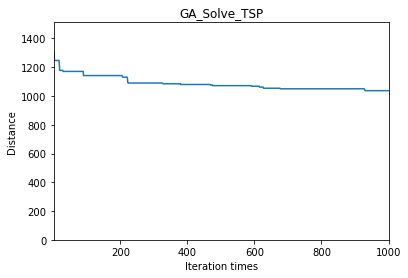

In [8]:
import pandas as pd
from pandas import DataFrame

# read file
dic = {}
readfile(dic)
chromo_num = 100
iter_num = input('How many iterations you want to run? ')
iter_num = int(iter_num) # origin: str , After: int
player = 25
history = []

start = time.time()  # time get
#########################################################
# step 1: initialization and implement fitness function
#########################################################

chromo_data = init(len(dic), chromo_num) # init(51, 100)
#print(chromo_data.keys())
chromo_data = fitness(chromo_data, dic)
#chromo_df = pd.DataFrame(chromo_data['distance'])
#print(chromo_data)
#print(chromo_df)

for i in range(1, iter_num+1):
#########################################################
# step 2: crossover and mutation
#########################################################
    #selection
    chromo_data = select(chromo_data, player)
    chromo_data = fitness(chromo_data, dic) # calculate distance
    #print(chromo_data)
    
    # do crossover
    chromo_data = crossover(chromo_data, 0.9)
    chromo_data = fitness(chromo_data, dic) # calculate distance
    
    #do mutation
    chromo_data = mutation(chromo_data, 0.1)
    chromo_data = fitness(chromo_data, dic) # calculate distance
    history.append(min(chromo_data['distance']))
    #print(history)
##########################
end = time.time()  #time get
print('Period= ', round(end-start, 2), ' sec\n')

print('Minimum distance of each iterations: \n', history)
print('Final distance: ', min(history))

# draw dynamic plot
######################################################################################
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation
import numpy as np

y = history


fig, ax = plt.subplots()
plt.title("GA_Solve_TSP")
plt.xlabel("Iteration times")
plt.ylabel("Distance")
xdata, ydata = [], []
ax.axis([1,iter_num,0,max(history)+200])
l, = ax.plot([], [], animated=False)

def update(frame):
    xdata.append(frame+1)
    ydata.append(y[frame])
    l.set_data(xdata, ydata)
    return l,

ani = matplotlib.animation.FuncAnimation(fig, update, frames=iter_num,blit=True)

#output gif
#ani.save('GA_Solve_TSP.gif',writer='pillow', fps=80)

from IPython.display import HTML
HTML(ani.to_jshtml())

######################################################################################